# CarND-Behavioral Cloning
Here is the code and documentation for the project that I did for Udacity Self-Driving car class- Project 3, Behavioral Cloning.
In this document, I explain all of the steps taken one by one.

## Behavioral Cloning Project Goals:

The goals / steps of this project are the following:<br/>
1-Use the simulator to collect data of good driving behavior<br/>
2-Build, a convolution neural network in Keras that predicts steering angles from images<br/>
3-Train and validate the model with a training and validation set<br/>
4-Test that the model successfully drives around track one without leaving the road<br/>
5-Summarize the results with a written report<br/>


## Step 0-Loading Modules<br />
Nothing special here, just loading modules that we will need for this project.<br />

In [ ]:
import csv
import matplotlib.pyplot as plt
import cv2
import numpy as np
import os
import keras
from keras.models import Sequential
from keras.layers import Flatten,Dense,Lambda,Dropout
from keras.layers.convolutional import Convolution2D, Cropping2D,MaxPooling2D
import sklearn
from sklearn.model_selection import train_test_split
import random as rand

## 1-Use the simulator to collect data of good driving behavior<br/>
Generally simulator can be used to gather images of good driving behabvior. Also there are plenty of data already captured from good driving behavior including UDACITY data provided as a start.<br/>
For this project, I tried training the system on couple of different data sets including my data set, UDACITY data set and Patrick Kern (GitHub:Pkern90) data set and also different possible combinations.
The best result came from the case that I used UDACITY data set and Patrick Kern deta set all together.<br/>
Below I just add a code to read and show example of images from different cameras:<br>

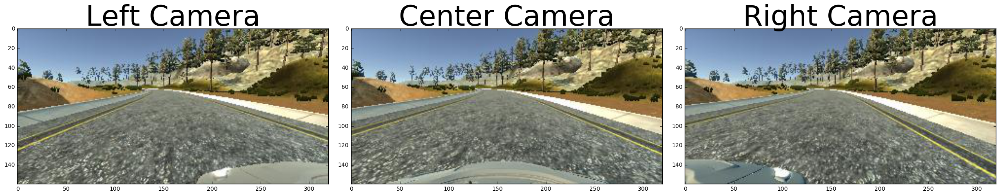

In [10]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline
center_img = mpimg.imread('./Images/center_2016_11_22_14_57_02_995.jpg')
left_img = mpimg.imread('./Images/left_2016_11_22_14_57_02_995.jpg')
right_img = mpimg.imread('./Images/right_2016_11_22_14_57_02_995.jpg')
#plt.imshow(img)
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(left_img)
ax1.set_title('Left Camera', fontsize=50)
ax2.imshow(center_img)
ax2.set_title('Center Camera', fontsize=50)
ax3.imshow(right_img)
ax3.set_title('Right Camera', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=2, bottom=0.)

## 2-Build, a convolution neural network in Keras that predicts steering angles from images<br/>
## 3-Train and validate the model with a training and validation set<br/>

Here first I explain the general pipeline and then I go over challenges and then I describe the code.Ok, here is the main pipeline:<br/>
First I open Excel files and read them line by line and from each line extract the address for left,center and right imaghs in addition to angles for each image.Then I can use addresses to open the images and then I need to use data augmentation to increase number of samples that I have and increase my ability to train the final Deep Neural Network that I call model here. Then I use these images and related measurments(angles) to train my model and I check our validation loss and then I save the trained model.<br/>
Seems easy but there are couple of challenges and decisions I need to make.
The main challenge here is, since I may need to use very large set of data, reading all images at once can cause my system to get out of memory.<br/>
To address this I use generator. Generator basically can run for ever and also feed data to our model gradually in the size that I define. I use generators to avoid memory problem.
Also since I might want to read data from different folders to increase my data samples, I introduced a parent_folder that all other data can be inside it in different folders. Each inner folder has an img_folder and a .csv file that holds addresses to images and measurements. I need to incorparate this with generator in an effective way. To do so, I first find list of all folders in parent_folder and then we open each folder and only read lines and also we add inner folders name to the end of each line. Since this content is only text that I'm reading,storing them all will not use much memory comparing it with reading all images.<br/>
Now I pass these lines list into generator and I shuffle them to make sure data is not biased. Then I batch them in batch_size and in each batch we open the center, left and right image and also angles(measurements). For each imahge, I also add flipped image with  negated measurement value for center image and for all left and right images I also apply correction factor to measurement value. Then I pass this to Keras Model.<br/>
Another point here is, this generator can also be used for reading validation images, augmenting them and feeding to model batch by batch and calculate validation loss.<br/> 
The Keras model here, is very close NVIDIA model with some modifications. First I start a Sequential model. Then I add a lambda layer to normalize the data wigth input shape of image size that is 160x320x3. Then I use a cropping layer and cut 75 pixels from top that is basically sky. 25 pixels from bottom that is partly filled with car itself, and 20 pixels from left and right side each. This makes model insensitive to sky and also increases training speed by decreasing the data size. After these layers, the model has 3 convolutional layers with filter size of 3X3 that increases output depth to 16, 32 and 64 in each layer. All of these convolutional layers have Relu activation and also followed by maxpooling with size of 2x2. The maxpooling layers help keep the system away from overfitting. Then I have a flatten layer followed by 4 fully connected layers that decreases the depth from 400 to 100, from 100 to 20 and from 20 to 1 that is final output. Final output is the angel that we need for driving the car. Then I use Adam optimizer to minimize Mean Squared Error as our criteria for minimizing the error(loss) in output. Then I use fit_generator to get the data from generator and also I define total number of test and validation samples 6 times of the lines that I read from files at the start.Then I save the model that can be used later for autonomous driving.

In [ ]:
#Folders Will Store Name of Folders That Contain Training Images
parent_folder='data'
folders=[]
folder_list=os.listdir(parent_folder+'/')
#Correction that later will be applied to Left and Right Camera Measurement Values
correction=0.2
epoches=8
batch_size=32
#Reads lines in csv files in different folders inside parent folder
lines=[]
for folder in folder_list:
  #Opening CSV File in Each Folder and Reading each Line and Storing in Lines[]
  with open('./'+parent_folder+'/'+folder+'/driving_log.csv') as csvfile:
      reader =csv.reader(csvfile)
      for line in reader:
        line.append(folder)
        lines.append(line)
# Each line has 3 images(center, left and right) and each image also will have a flip so
# number of lines*6 is total number of images
print('Number of Lines',len(lines))
print('Total Number of images:',6*len(lines))
#Splitting data to train and test data. 20% of images will be test images
train_samples, validation_samples = train_test_split(lines, test_size=0.2)
#Reading each Lines and Extracting The Path For Center, Left and Right Images and reading
#them. Also adding flipped images and measurements. All happens in generator to make sure
# there will be no problem with memory.
def generator(lines, batch_size=batch_size):
    num_samples = len(lines)
    while 1: # Loop forever so the generator never terminates
        rand.shuffle(lines)
        for offset in range(0, num_samples, batch_size):
            batch_samples = lines[offset:offset+batch_size]
            images=[]
            measurements=[]
            for line in batch_samples:
                main_folder=line[-1]
                measurement=float(line[3])
                flipped_measurement=(measurement)*-1.0
                for i in range(0,3):
                   source_path=line[i]
                   tokens=source_path.split('/')
                   filename=tokens[-1]
                   local_path='./'+parent_folder+'/'+main_folder+"/IMG/"+filename
                   #Reading Image and measurement and Appending to Images[] and #measurements[]
                   image=cv2.imread(local_path)
                   images.append(image)
                   #Flipping image and measurement and adding correction
                   flipped_image=cv2.flip(image,1)
                   images.append(flipped_image)
                   if i==0:
                      measurements.append(measurement)
                      measurements.append(flipped_measurement)
                   elif i==1:
                      measurements.append(measurement+correction)
                      measurements.append(flipped_measurement+correction)
                   else:
                      measurements.append(measurement-correction)
                      measurements.append(flipped_measurement-correction)
            X_train = np.array(images)
            y_train = np.array(measurements)
            yield sklearn.utils.shuffle(X_train, y_train)

train_generator = generator(train_samples, batch_size=batch_size)
validation_generator = generator(validation_samples, batch_size=batch_size)
#Defining Keras model, Modified NVIDIDA
model=Sequential()
#Adding normalization and cropping layers
model.add(Lambda(lambda x:x/255.0-0.5,input_shape=(160,320,3)))
model.add(Cropping2D(cropping=((75,25),(20,20))))
#Main model
model.add(Convolution2D(16, 3,3, activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Convolution2D(32, 3, 3, activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Convolution2D(64, 3, 3, activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(400, activation='relu'))
model.add(Dense(100, activation='relu'))
model.add(Dense(20, activation='relu'))
model.add(Dense(1))
#Using Adam Optimizer and MSE Loss Function For Regression 
model.compile(optimizer='adam',loss='mse')
#Training The Model,20% of Data is Allocated for Validation
#It is important to notice that there are 6 images per line is read in generator, so in the
# fit_generator we must consider 6*len(train_samples) as total number of samples
model.fit_generator(train_generator, samples_per_epoch= 6*len(train_samples), validation_data=validation_generator,
            nb_val_samples=6*len(validation_samples), nb_epoch=epoches)
#Saving The Model
model.save('model.h5')

## 4-Test that the model successfully drives around track one without leaving the road<br/>
After training the model. the saved model file can be used with drive.py file in the format of python drive.py model.h5 folder_name. The folder_name here is optional and if added it saves the autonomous driving pictures in folder_name. Later Video.py file can be ran with python vodeo.py folder_name to make a video from saved frames.<br/>
Below is a code that can show play the result here.

In [11]:
import io
import base64
from IPython.display import HTML

video = io.open('result.mp4', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii')))

## 5-Summarize the results with a written report<br/>
So now that I have required tools I can start training the model.
I used Amazon AWS GPU systems for training the model. For training the model I have tried many different combinations of some parameters that I mention below:<br/>
### - Correction Factor
I changed correction from 0.05 to 0.3. Higher values of correction factor makes the model react to changes much faster with much more strong change in angles. This is good for very big and rapid turns but makes the vehicle to move alot to left and right even in straight line driving.On the other end,0.05 makes the driving more stable but reaction speed and strength is not enough for model to overcome rapid changes like big turns. I chose 0.2 as the correction factor and it worked fine.<br/>
### - Deep Neural Network Archtitecture
I have to say spend a lot of time on changing the model itself. I tried different number of layers, different activations like ELU, adding dropout layer with different dropping factors. Finally the above mentioned architecture resulted in best performance.<br/>
### - Training Data size
I have tried many different sets of data including UDACITYA data, Patrick Kern data, and some data thast I gathered myself. The whole data I used is around 24,800 lines that considering left,right, center and flipped images, results in around 149000 images. These data contains center driving, recovery images and reverse driving images.<br/>
<br/>
After changing all these parameters finally model worked and result of autonomous drivinhg was acceptable. I used 8 total number of epochs. During this 8 epochs, both training loss and validation loss has decreased. Training for more epochs will increase validation loss that is a signe of overfitting. It is worth mentioning that on AWS GPU systems, it took about 270 seconds (4.5 minutes) for each epoch that adds up to about 36 minutes for training the model.<br/>